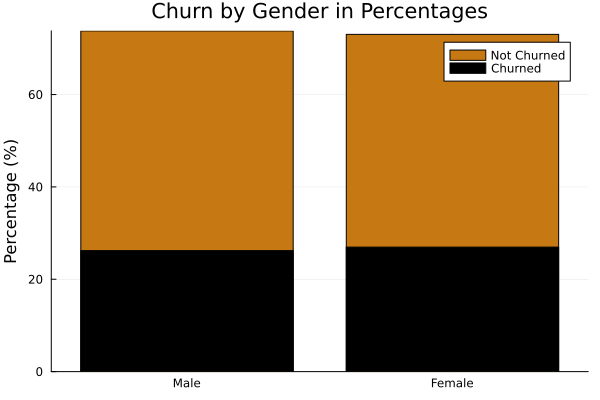

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\Distribution_of_Gender.png"

In [1]:
using CSV, DataFrames, Plots

# Load your data
df = CSV.read("data/telco_cleaned.csv", DataFrame)

grouped = combine(groupby(df, [:gender, :churn_value]), nrow => :count)

# Pivot the table to have churn_values as columns
pivot_df = unstack(grouped, :gender, :churn_value, :count, fill=0)

not_churned_col = Symbol("0") 
churned_col = Symbol("1") 

pivot_df[!, :Not_Churned] = (pivot_df[!, not_churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100
pivot_df[!, :Churned] = (pivot_df[!, churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100

# Plot
p = bar(pivot_df.gender, [pivot_df.Not_Churned pivot_df.Churned], 
        label=["Not Churned" "Churned"], 
        stacked=true, 
        color=["#C67812" :black], 
        ylabel="Percentage (%)", 
        title="Churn by Gender in Percentages",
        legend=:topright)
display(p)

savefig(p, "Distribution_of_Gender.png")

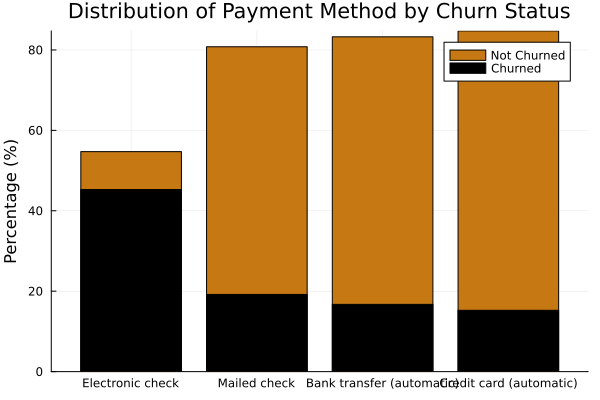

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\Distribution_of_payment_method.png"

In [2]:
using CSV, DataFrames, Plots

# Load your data
df = CSV.read("data/telco_cleaned.csv", DataFrame)

# Group and count by payment method and churn value
grouped = combine(groupby(df, [:payment_method, :churn_value]), nrow => :count)

# Pivot the table to have churn_values as columns
pivot_df = unstack(grouped, :payment_method, :churn_value, :count, fill=0)

# Assuming churn values are "Yes" and "No" in your dataset
not_churned_col = Symbol("0") 
churned_col = Symbol("1")

# Calculate the percentages
pivot_df[!, :Not_Churned] = (pivot_df[!, not_churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100
pivot_df[!, :Churned] = (pivot_df[!, churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100

# Sort by Not Churned percentage (optional)
sort!(pivot_df, :Not_Churned)

# Plot
p = bar(pivot_df.payment_method, [pivot_df.Not_Churned pivot_df.Churned], 
        label=["Not Churned" "Churned"], 
        stacked=true, 
        color=["#C67812" :black], 
        ylabel="Percentage (%)", 
        title="Distribution of Payment Method by Churn Status",
        legend=:topright)
display(p)

# Save the plot to a file
savefig(p, "Distribution_of_payment_method.png")


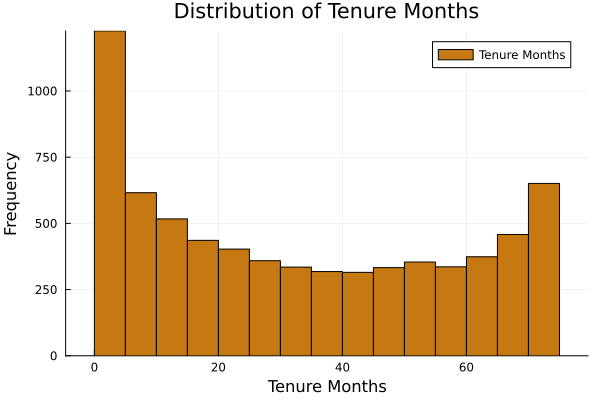

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\tenure_months_histogram.png"

In [3]:
p_tenure = Plots.histogram(df.tenure_months, bins=30, label="Tenure Months", 
                     xlabel="Tenure Months", ylabel="Frequency", 
                     title="Distribution of Tenure Months", 
                     color="#C67812")
display(p_tenure)
savefig(p_tenure, "tenure_months_histogram.png")

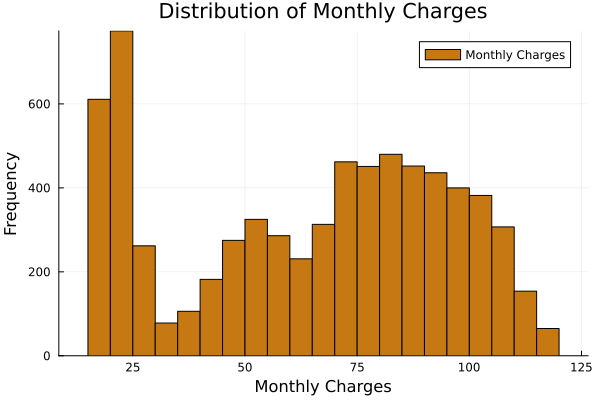

In [5]:
p_monthly_charges = histogram(df.monthly_charges, bins=30, label="Monthly Charges", 
                              xlabel="Monthly Charges", ylabel="Frequency", 
                              title="Distribution of Monthly Charges", 
                              color="#C67812")
display(p_monthly_charges)

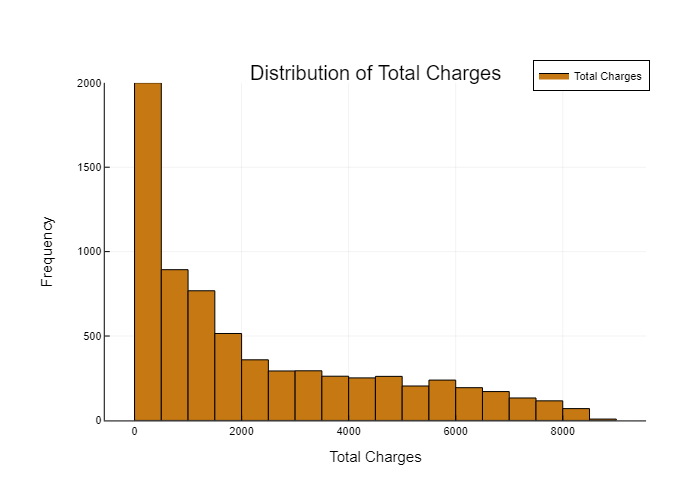

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\Total_Charges.png"

In [56]:
p_total_charges = histogram(df.total_charges, bins=30, label="Total Charges", 
                            xlabel="Total Charges", ylabel="Frequency", 
                            title="Distribution of Total Charges", 
                            color="#C67812")
display(p_total_charges)

savefig(p_total_charges, "Total_Charges.png")

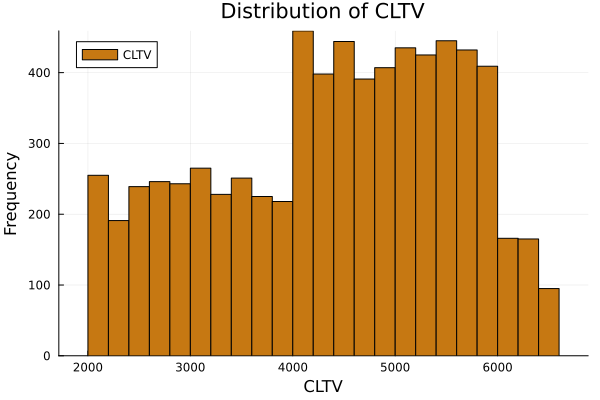

In [7]:
p_cltv = histogram(df.cltv, bins=30, label="CLTV", 
                   xlabel="CLTV", ylabel="Frequency", 
                   title="Distribution of CLTV", 
                   color="#C67812")
display(p_cltv)

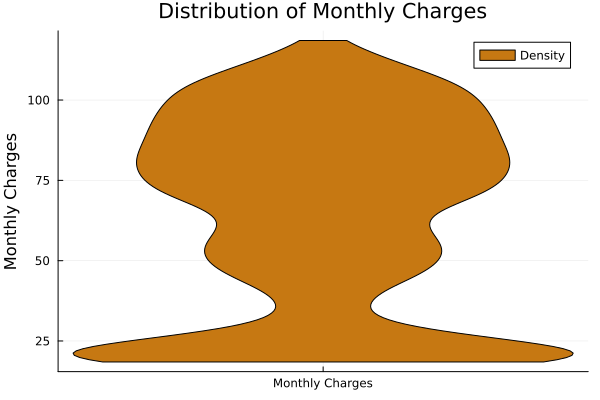

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\monthly_charges_violin.png"

In [9]:
gr() 

# Create a violin plot for monthly_charges
p_monthly_charges_violin = violin(["Monthly Charges"], df.monthly_charges, 
                                   color="#C67812", 
                                   label="Density",
                                   xlabel="",
                                   ylabel="Monthly Charges", 
                                   title="Distribution of Monthly Charges")

# Display the plot
display(p_monthly_charges_violin)

# Save the plot if needed
savefig(p_monthly_charges_violin, "monthly_charges_violin.png")


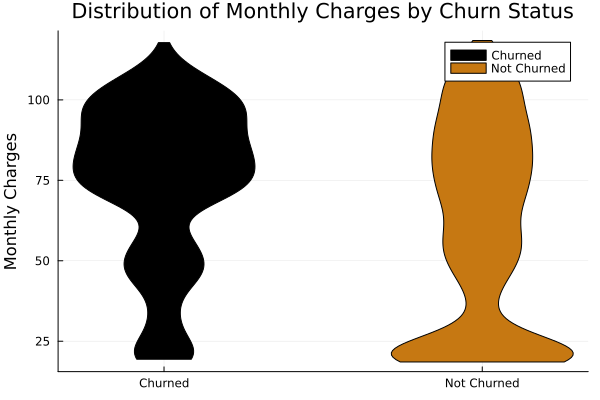

In [10]:
gr() 

# Create separate groups for churned and not churned customers
churned = df[df.churn_value .== 1, :]
not_churned = df[df.churn_value .== 0, :]

# Plot these as separate groups in the violin plot
p = violin(["Churned"], churned.monthly_charges, color = "black", label = "Churned")
violin!(["Not Churned"], not_churned.monthly_charges, color = "#C67812", label = "Not Churned")

# Set labels and title
xlabel!(p, "")
ylabel!(p, "Monthly Charges")
title!(p, "Distribution of Monthly Charges by Churn Status")

# Display the plot
display(p)


In [13]:
using Pkg
Pkg.add("PlotlyJS")


   Resolving package versions...
  No Changes to `C:\Users\EndUser\Desktop\Winter 2024\STAT 206\Telecom\Project.toml`
  No Changes to `C:\Users\EndUser\Desktop\Winter 2024\STAT 206\Telecom\Manifest.toml`


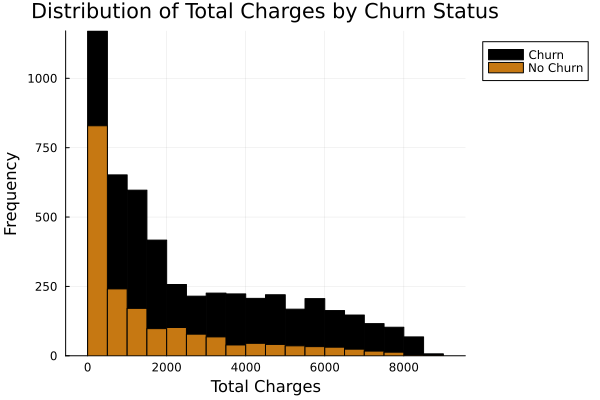

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\Total_Charges_Churn_Status.png"

In [12]:
p1 = @df df histogram(:total_charges, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Total Charges", ylabel="Frequency", 
                      title="Distribution of Total Charges by Churn Status",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p1)

savefig(p1, "Total_Charges_Churn_Status.png")


In [43]:
Pkg.add("CategoricalArrays")

   Resolving package versions...
  No Changes to `C:\Users\EndUser\Desktop\Winter 2024\STAT 206\Telecom\Project.toml`
  No Changes to `C:\Users\EndUser\Desktop\Winter 2024\STAT 206\Telecom\Manifest.toml`


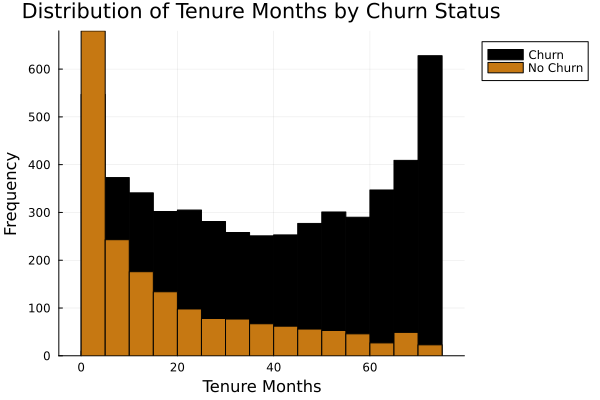

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\Tenure_Months_Churn_Status.png"

In [13]:
# Create a histogram for tenure_months grouped by churn_value
# Specifying colors and labels for clarity
p2 = @df df Plots.histogram(:tenure_months, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Tenure Months", ylabel="Frequency", 
                      title="Distribution of Tenure Months by Churn Status",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p2)
savefig(p2, "Tenure_Months_Churn_Status.png")


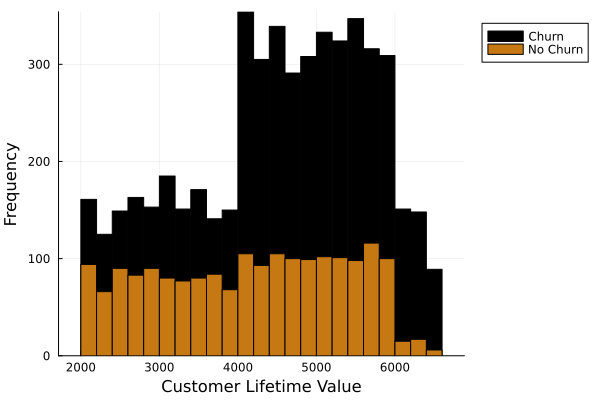

"C:\\Users\\EndUser\\Desktop\\Winter 2024\\STAT 206\\Telecom\\CLTV_Status.png"

In [14]:
# Create a histogram for tenure_months grouped by churn_value
# Specifying colors and labels for clarity
p2 = @df df Plots.histogram(:cltv, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Customer Lifetime Value", ylabel="Frequency", 
                      title="",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p2)
savefig(p2, "CLTV_Status.png")


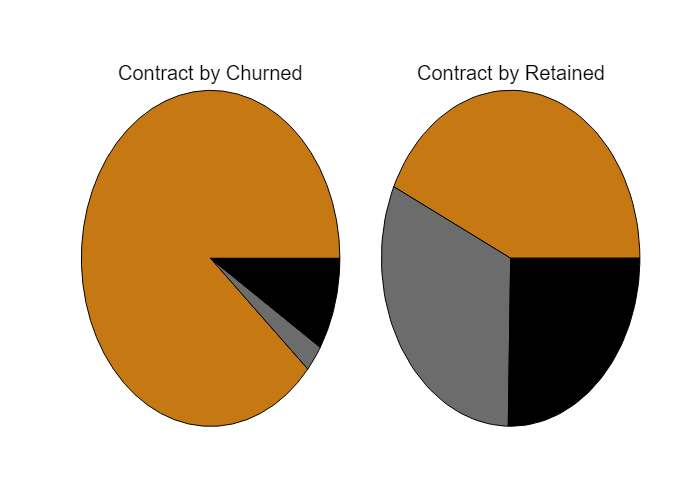

In [55]:
# Convert churn_value to a categorical variable for plotting
df.churn_value = categorical(df.churn_value)

# Aggregate the data
agg_df = combine(groupby(df, [:contract, :churn_value]), nrow => :Count)

# Separate data for churned and retained customers
churn_yes_df = filter(row -> row.churn_value == 1, agg_df)
churn_no_df = filter(row -> row.churn_value == 0, agg_df)

# Generate labels for pie charts
labels_yes = [string(row.contract, ": ", row.Count) for row in eachrow(churn_yes_df)]
labels_no = [string(row.contract, ": ", row.Count) for row in eachrow(churn_no_df)]

# Define a color palette
colors = ["#c67812", "#6c6c6c", "black"]

# Generate pie charts with specified colors
p1 = Plots.pie(churn_yes_df.contract, churn_yes_df.Count, labels=labels_yes, title="Contract by Churned", legend=false, color=colors)
p2 = Plots.pie(churn_no_df.contract, churn_no_df.Count, labels=labels_no, title="Contract by Retained", legend=false, color=colors)

# Display the pie charts side by side with adjusted size
plot(p1, p2, layout=(1, 2), size=(1000, 500))


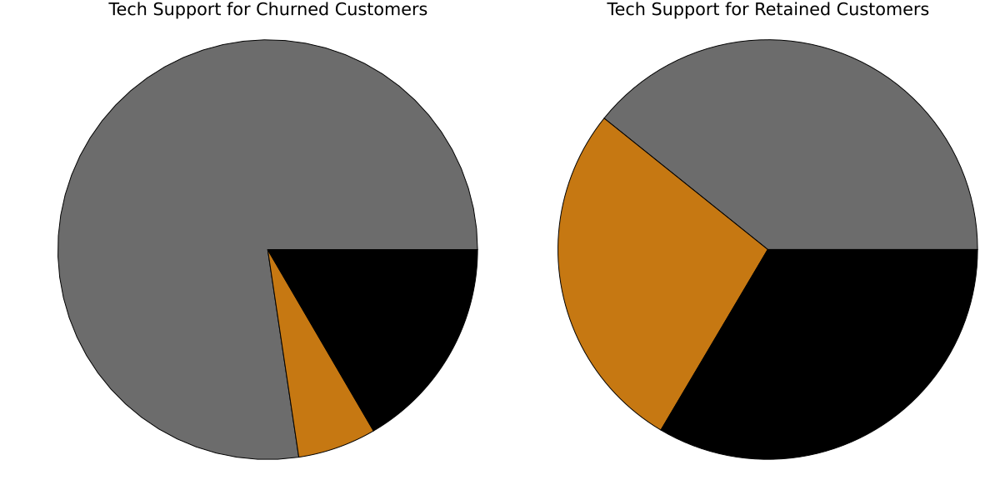

In [23]:
df.tech_support = categorical(df.tech_support)

# Define colors for each category of tech_support
colors = ["#6c6c6c", "#c67812", "black"]  # Color mapping: No, Yes, No internet service

# Group by tech_support and churn_value, then count the occurrences
agg_df = combine(groupby(df, [:tech_support, :churn_value]), nrow => :Count)

# Separate data for churned and retained customers
churn_yes_df = filter(row -> row.churn_value == 1, agg_df)
churn_no_df = filter(row -> row.churn_value == 0, agg_df)

# Labels for the segments
labels = ["No", "Yes", "No internet service"]

# Create pie charts
# Pie chart for churned customers
p1 = Plots.pie(churn_yes_df.tech_support, churn_yes_df.Count, 
         labels=labels, 
         title="Tech Support for Churned Customers", 
         legend=false, 
         color=colors)

# Pie chart for retained customers
p2 = Plots.pie(churn_no_df.tech_support, churn_no_df.Count, 
         labels=labels, 
         title="Tech Support for Retained Customers", 
         legend=false, 
         color=colors)

plot(p1, p2, layout=(1, 2), size=(1200, 600))


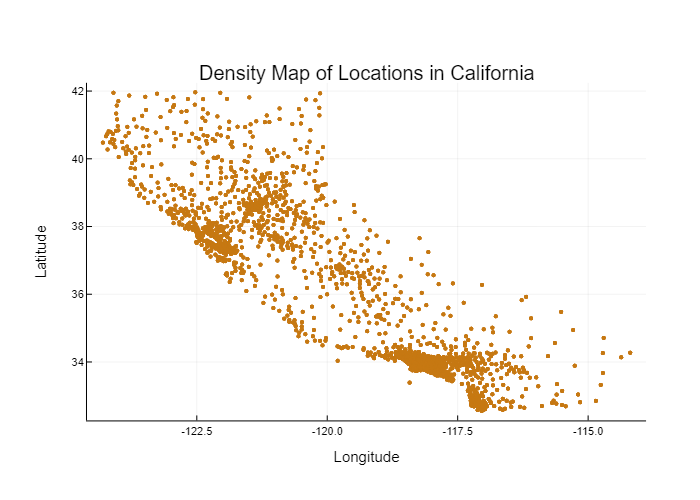

In [25]:
using CSV, DataFrames, Plots, PlotlyJS

# Load the data
df = CSV.read("data/telco_cleaned.csv", DataFrame)

# Extract the latitude and longitude data
lats = df[:, :latitude]
longs = df[:, :longitude]

# Switch to PlotlyJS for an interactive backend
Plots.plotlyjs()

# Plot the density map with latitude and longitude data
density_map = Plots.scatter(longs, lats, 
                            markersize=2, 
                            markerstrokewidth=0, 
                            markerstrokealpha=0, 
                            markercolor="#c67812", 
                            title="Density Map of Locations in California", 
                            xlabel="Longitude", 
                            ylabel="Latitude", 
                            legend=false)

# Display the plot
display(density_map)

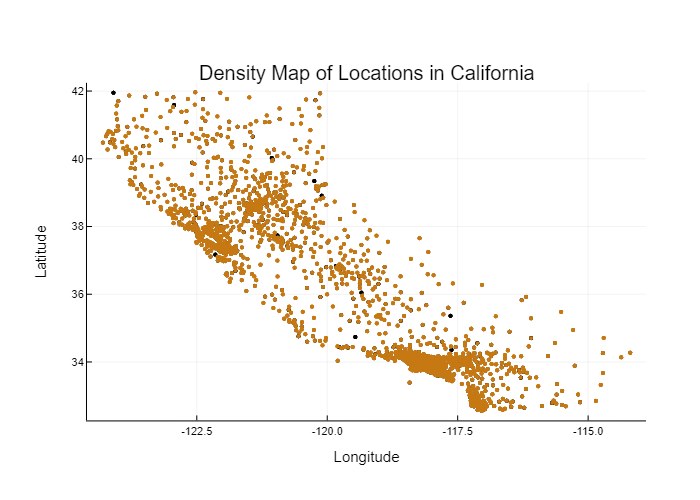

In [27]:
using CSV, DataFrames, Plots, PlotlyJS

# Load the data
df = CSV.read("data/telco_cleaned.csv", DataFrame)

# Extract the latitude and longitude data
lats = df[:, :latitude]
longs = df[:, :longitude]

# Switch to PlotlyJS for an interactive backend
Plots.plotlyjs()

# Assign colors based on churn_value: black for churn_value == 1, #c67812 for the rest
colors = [churn == 1 ? "black" : "#c67812" for churn in df[:, :churn_value]]

# Plot the density map with latitude and longitude data
density_map = Plots.scatter(longs, lats, 
                            markersize=2, 
                            markerstrokewidth=0, 
                            markerstrokealpha=0, 
                            markercolor=colors,  # Apply the conditional colors
                            title="Density Map of Locations in California", 
                            xlabel="Longitude", 
                            ylabel="Latitude", 
                            legend=false)

# Display the plot
display(density_map)


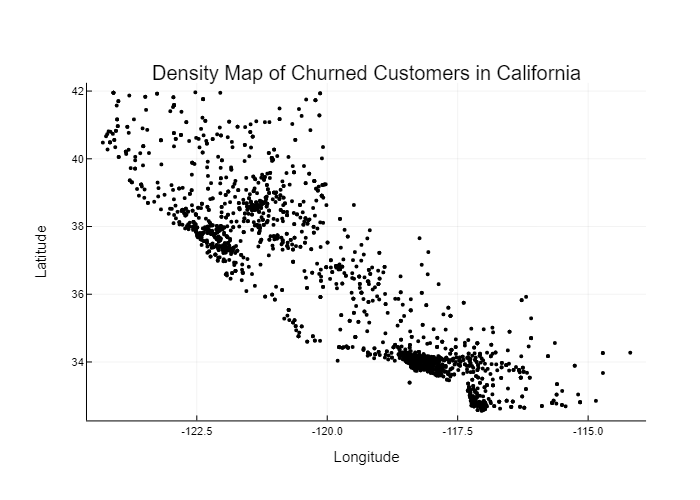

In [28]:
using CSV, DataFrames, Plots, PlotlyJS

# Assuming 'df' is your DataFrame and is already loaded with the necessary data
# If not, load the data using CSV.read

# Filter the DataFrame for rows where churn_value == 1
churned_df = filter(row -> row.churn_value == 1, df)

# Extract the latitude and longitude data for churned customers
churned_lats = churned_df[:, :latitude]
churned_longs = churned_df[:, :longitude]

# Plot the density map with latitude and longitude data for churned customers
churned_density_map = Plots.scatter(churned_longs, churned_lats, 
                                    markersize=2, 
                                    markerstrokewidth=0, 
                                    markerstrokealpha=0, 
                                    markercolor="black", 
                                    title="Density Map of Churned Customers in California", 
                                    xlabel="Longitude", 
                                    ylabel="Latitude", 
                                    legend=false)

# Display the plot
display(churned_density_map)
